In [1]:
import import_ipynb
import Scanpy_functions_v03262021 as sc_pipe
import scvelo as scv
scv.logging.print_version()
import warnings
import scirpy as ir
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
import bbknn
import logging
from sklearn.mixture import GaussianMixture
from scipy.stats     import norm
import glob
import os
import hvplot.pandas
import docx
from docx import Document
from docx.shared import Inches
from docx.shared import Pt
from scipy import sparse
import scanpy.external as sce
import holoviews as hv
import panel as pn
import bokeh
from bokeh.resources import INLINE
import scanorama
import gseapy

importing Jupyter notebook from Scanpy_functions_v03262021.ipynb
Running scvelo 0.2.3 (python 3.8.12) on 2022-03-07 10:00.
Running scvelo 0.2.3 (python 3.8.12) on 2022-03-07 10:01.


In [2]:
# define sample metadata. Usually read from a file.
exclude_genes = ['RPL', 'RPS', 'TRAV', 'TRAJ', 'TRBJ', 'TRBV','MRP','FAU','DAP3','UBA52','IGHV', 'IGKV', 'IGLV','MALAT1']


In_path = '/user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/'

out_path = '/user/ifrec/liuyuchen/Analysis_Reports/Akira_Fukusima_scRNASeq/human/'

In [3]:
#sc.set_figure_params(scanpy=True, dpi=200,  figsize=[12.8,9.6])
sc.settings.verbosity = 3

In [4]:
samples = {}
sample_list = In_path+'sample_list.txt'
for line in open(sample_list):
    tag= line.strip()
    samples[tag] ={}

In [5]:
adata_list = sc_pipe.data_IO(samples,In_path,IG=False)

... reading from cache file cache/user-ifrec-liuyuchen-scRNASeq_DATA-Akira_Fukusima_scRNASeq-human-BAL_TY-09_5DE-velocyto-BAL_TY-09_5DE.h5ad


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-09_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:02)
... reading from cache file cache/user-ifrec-liuyuchen-scRNASeq_DATA-Akira_Fukusima_scRNASeq-human-BAL_TY-10_5DE-velocyto-BAL_TY-10_5DE.h5ad


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-10_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:02)
... reading from cache file cache/user-ifrec-liuyuchen-scRNASeq_DATA-Akira_Fukusima_scRNASeq-human-BAL_TY-11_5DE-velocyto-BAL_TY-11_5DE.h5ad


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-11_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:02)
... reading from cache file cache/user-ifrec-liuyuchen-scRNASeq_DATA-Akira_Fukusima_scRNASeq-human-BAL_TY-12_5DE-velocyto-BAL_TY-12_5DE.h5ad


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-12_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)
... reading from cache file cache/user-ifrec-liuyuchen-scRNASeq_DATA-Akira_Fukusima_scRNASeq-human-BAL_TY-13_5DE-velocyto-BAL_TY-13_5DE.h5ad


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-13_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)
... reading from cache file cache/user-ifrec-liuyuchen-scRNASeq_DATA-Akira_Fukusima_scRNASeq-human-BAL_TY-14_5DE-velocyto-BAL_TY-14_5DE.h5ad


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-14_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)
... reading from cache file cache/user-ifrec-liuyuchen-scRNASeq_DATA-Akira_Fukusima_scRNASeq-human-BAL_TY-15_5DE-velocyto-BAL_TY-15_5DE.h5ad


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-15_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)
... reading from cache file cache/user-ifrec-liuyuchen-scRNASeq_DATA-Akira_Fukusima_scRNASeq-human-BAL_TY-1_5DE-velocyto-BAL_TY-1_5DE.h5ad


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-1_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)
... reading from cache file cache/user-ifrec-liuyuchen-scRNASeq_DATA-Akira_Fukusima_scRNASeq-human-BAL_TY-16_5DE-velocyto-BAL_TY-16_5DE.h5ad


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-16_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)
... reading from cache file cache/user-ifrec-liuyuchen-scRNASeq_DATA-Akira_Fukusima_scRNASeq-human-BAL_TY-17_5DE-velocyto-BAL_TY-17_5DE.h5ad


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-17_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:02)
... reading from cache file cache/user-ifrec-liuyuchen-scRNASeq_DATA-Akira_Fukusima_scRNASeq-human-BAL_TY-19_5DE-velocyto-BAL_TY-19_5DE.h5ad


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-19_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)
... reading from cache file cache/user-ifrec-liuyuchen-scRNASeq_DATA-Akira_Fukusima_scRNASeq-human-BAL_TY-20_5DE-velocyto-BAL_TY-20_5DE.h5ad


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-20_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:02)
... reading from cache file cache/user-ifrec-liuyuchen-scRNASeq_DATA-Akira_Fukusima_scRNASeq-human-BAL_TY-2_5DE-velocyto-BAL_TY-2_5DE.h5ad


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-2_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)
... reading from cache file cache/user-ifrec-liuyuchen-scRNASeq_DATA-Akira_Fukusima_scRNASeq-human-BAL_TY-3_5DE-velocyto-BAL_TY-3_5DE.h5ad


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-3_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)
... reading from cache file cache/user-ifrec-liuyuchen-scRNASeq_DATA-Akira_Fukusima_scRNASeq-human-BAL_TY-4_5DE-velocyto-BAL_TY-4_5DE.h5ad


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-4_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)
... reading from cache file cache/user-ifrec-liuyuchen-scRNASeq_DATA-Akira_Fukusima_scRNASeq-human-BAL_TY-5_5DE-velocyto-BAL_TY-5_5DE.h5ad


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-5_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:02)
... reading from cache file cache/user-ifrec-liuyuchen-scRNASeq_DATA-Akira_Fukusima_scRNASeq-human-BAL_TY-6_5DE-velocyto-BAL_TY-6_5DE.h5ad


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-6_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)
... reading from cache file cache/user-ifrec-liuyuchen-scRNASeq_DATA-Akira_Fukusima_scRNASeq-human-BAL_TY-7_5DE-velocyto-BAL_TY-7_5DE.h5ad


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-7_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)
... reading from cache file cache/user-ifrec-liuyuchen-scRNASeq_DATA-Akira_Fukusima_scRNASeq-human-BAL_TY-8_5DE-velocyto-BAL_TY-8_5DE.h5ad


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-8_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


... writing an h5ad cache file to speedup reading next time


... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/TY26_BAL_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


... writing an h5ad cache file to speedup reading next time


... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/TY27_BAL_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:02)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


... writing an h5ad cache file to speedup reading next time


... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/TY28_BAL_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


... writing an h5ad cache file to speedup reading next time


... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/TY30_PBMC_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)


In [6]:
adata_list[1]

AnnData object with n_obs × n_vars = 18417 × 36601
    obs: 'Clusters', '_X', '_Y', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'Sample'
    var: 'gene_ids', 'feature_types', 'genome', 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [7]:
adata = sc_pipe.unify_value(adata_list)

In [8]:
adata.obs['Sample'].value_counts()

TY27_BAL_5DE     20450
BAL_TY-10_5DE    18417
BAL_TY-2_5DE     18366
BAL_TY-14_5DE    18137
BAL_TY-20_5DE    16947
BAL_TY-7_5DE     16816
BAL_TY-12_5DE    16158
BAL_TY-11_5DE    15547
BAL_TY-09_5DE    14277
BAL_TY-4_5DE     13488
BAL_TY-17_5DE    13414
TY30_PBMC_5DE    13288
BAL_TY-8_5DE     12131
BAL_TY-19_5DE    11629
BAL_TY-3_5DE     11415
BAL_TY-6_5DE     11391
BAL_TY-5_5DE     11264
BAL_TY-16_5DE     9111
TY28_BAL_5DE      8679
BAL_TY-1_5DE      8600
BAL_TY-15_5DE     7689
BAL_TY-13_5DE     4894
TY26_BAL_5DE      4532
Name: Sample, dtype: int64

In [9]:
del adata_list

normalizing counts per cell
    finished (0:00:06)


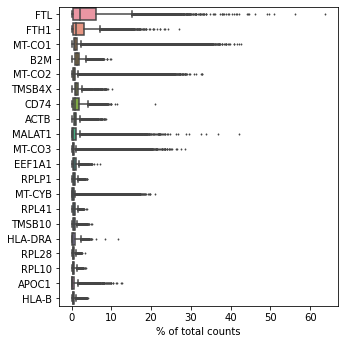

Running Scrublet
filtered out 8434 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:02)
extracting highly variable genes
    finished (0:00:13)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:01)
Embedding transcriptomes using PCA...
Detected doublet rate = 0.3%
Estimated detectable doublet fraction = 38.5%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 0.9%
    Scrublet finished (0:24:08)


... storing 'Sample' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


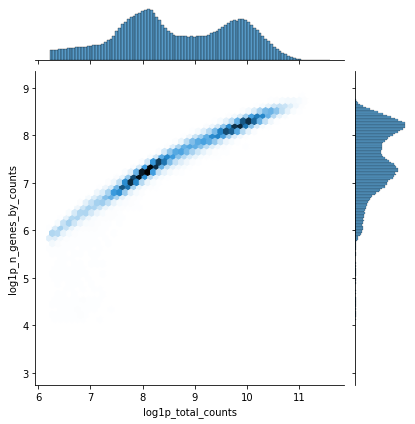

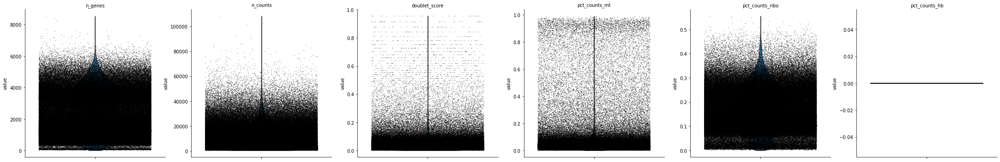

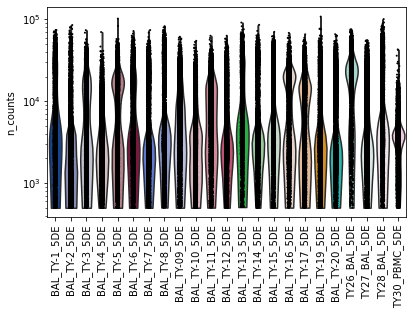

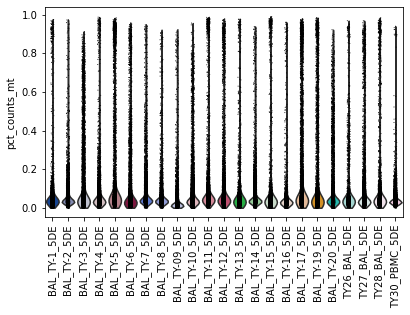

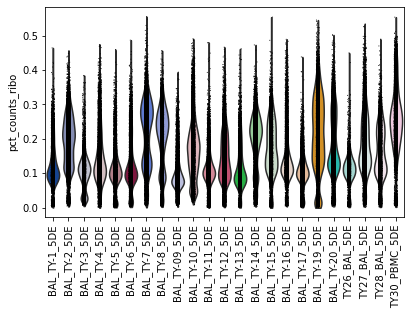

...

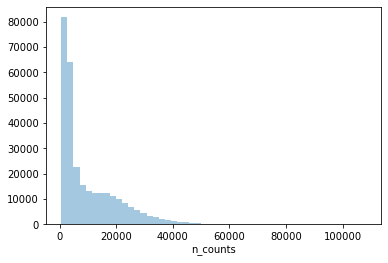

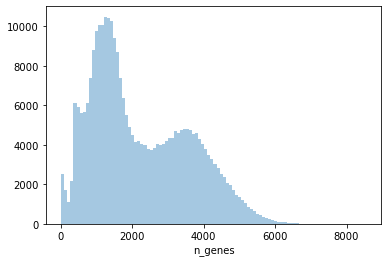

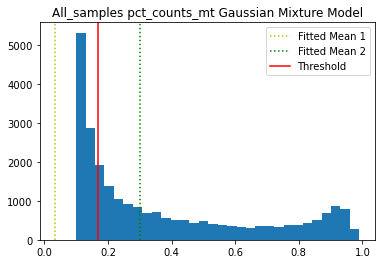

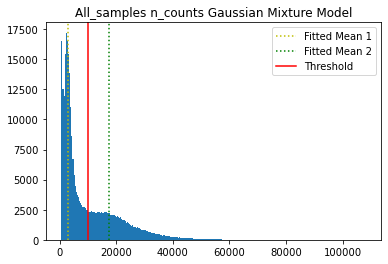

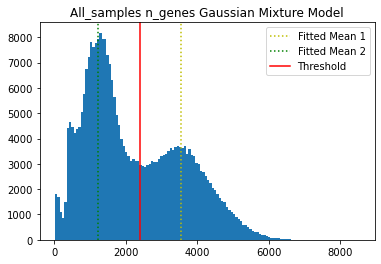

filtered out 0 cells that have less than 172 counts
filtered out 8434 genes that are detected in less than 3 cells
filtered out 8434 genes that are detected in less than 3 cells
filtered out 0 cells that have more than 54650878 counts
filtered out 16365 cells that has over 16% reads belong to mitochondrial genes
filtered out 171 cells that have less than 309 genes expressed


Trying to set attribute `.obs` of view, copying.


filtered out 171 cells that have less than 309 genes expressed
filtered out 959 cells that have over 5840 genes expressed


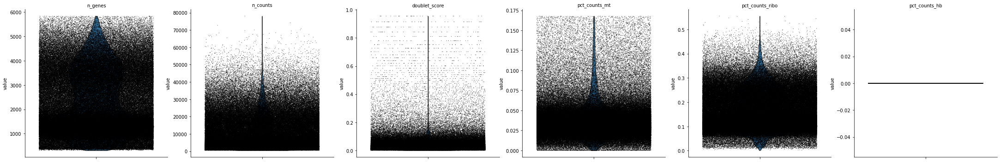

CPU times: user 29min 8s, sys: 1min 47s, total: 30min 55s
Wall time: 30min 1s


In [10]:
%%time
adata = sc_pipe.qc_and_preprocess(adata,out_path, multi_sample=True)

normalizing counts per cell
    finished (0:00:02)
normalizing counts per cell
    finished (0:00:04)


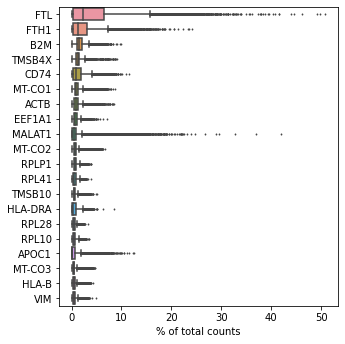

normalizing counts per cell
    finished (0:00:04)


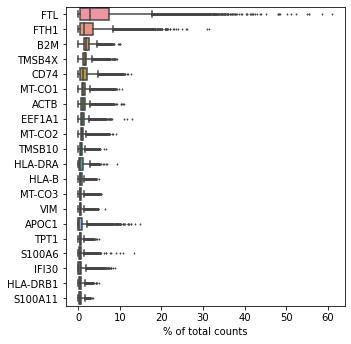

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 Number of highly variable genes: 4000


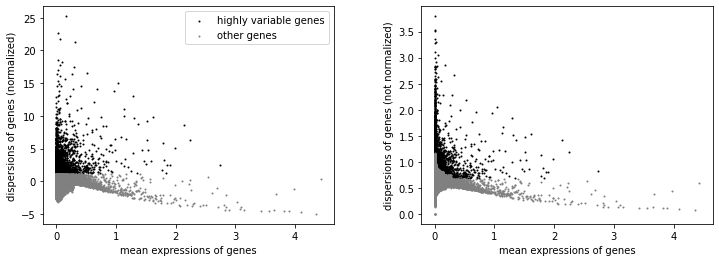

In [11]:
adata = sc_pipe.feature_selection(adata, out_path, exclude_genes)


In [12]:
adata

AnnData object with n_obs × n_vars = 279145 × 27666
    obs: 'Clusters', '_X', '_Y', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'Sample', 'batch', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb', 'doublet_score', 'predicted_doublet', 'n_counts', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'log_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Sample_colors', 'log1p', 'hvg'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:39)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:59)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:51)
computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	`.obsp['distances']`, distances for each pair of neighbors
	`.obsp['connectivities']`, weighted adjacency matrix (0:03:25)
running Leiden clustering
    finished: found 26 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:20:55)
running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:27)
--> added 'pos', the PAGA positions (adata.uns['paga'])


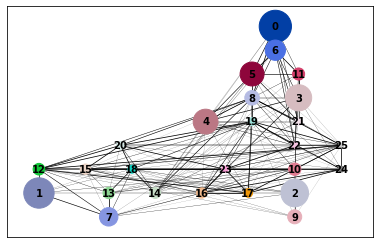

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:03:44)


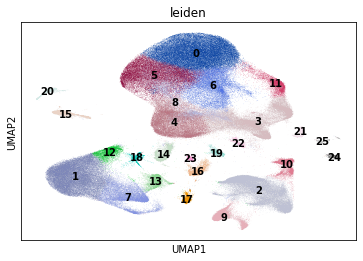

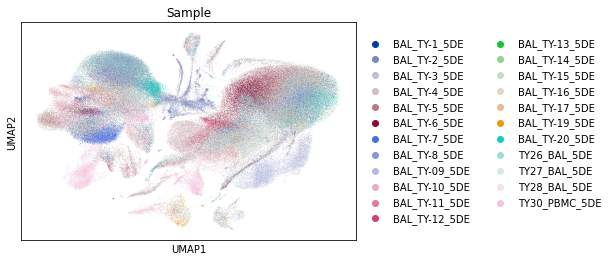

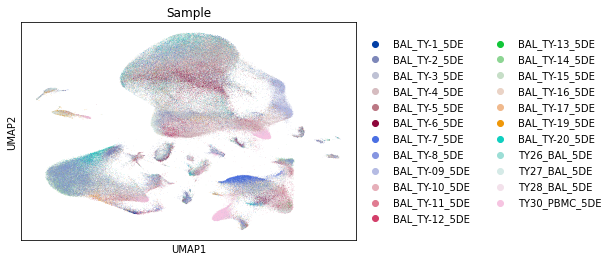

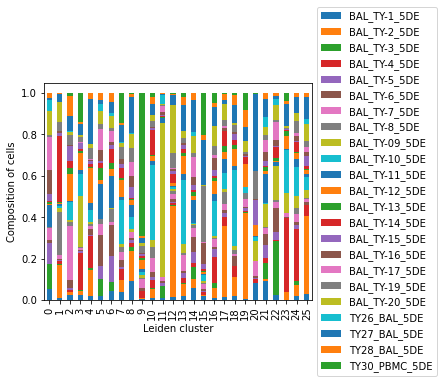

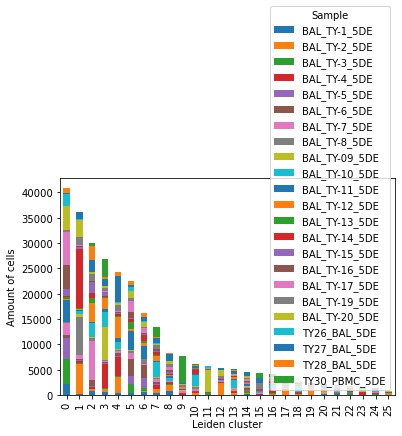

In [13]:
adata =  sc_pipe.BBKNN_clustering(adata,out_path, multi_sample=True, resol=1)
#adata = sc_pipe.clustering(adata,samples)

In [14]:
adata

AnnData object with n_obs × n_vars = 279145 × 27666
    obs: 'Clusters', '_X', '_Y', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'Sample', 'batch', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb', 'doublet_score', 'predicted_doublet', 'n_counts', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'log_counts', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Sample_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'paga', 'leiden_sizes', 'leiden_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers:

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:52)


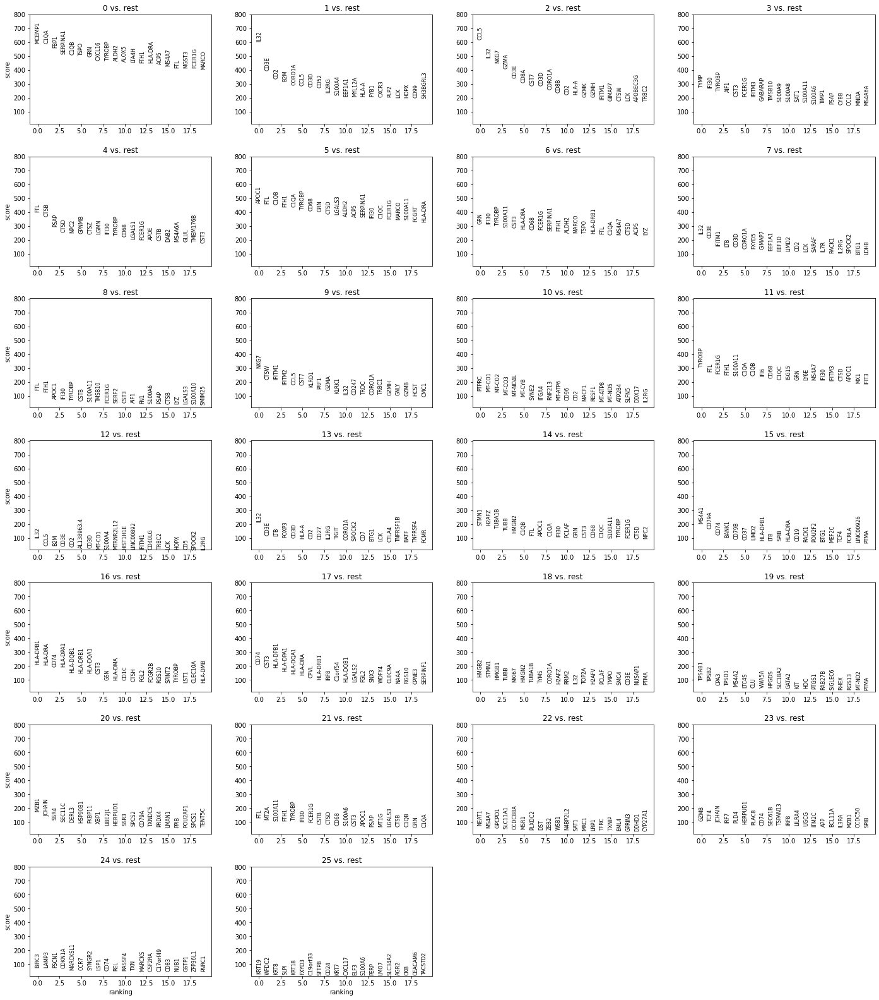

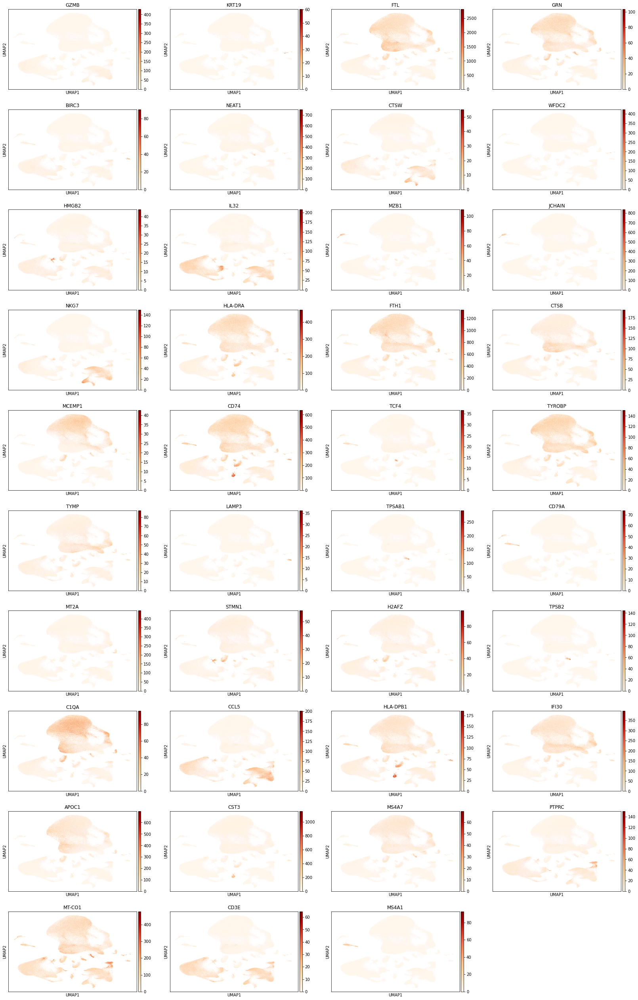

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


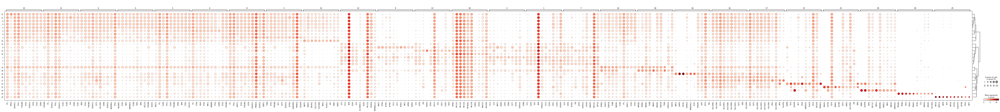

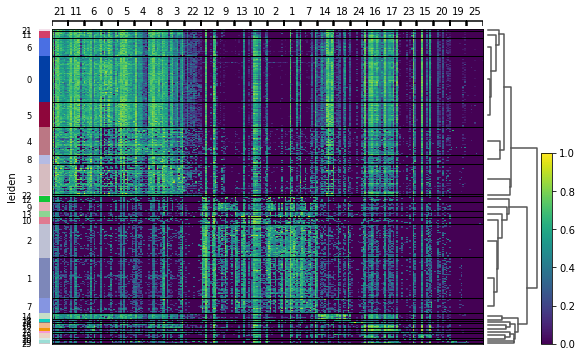

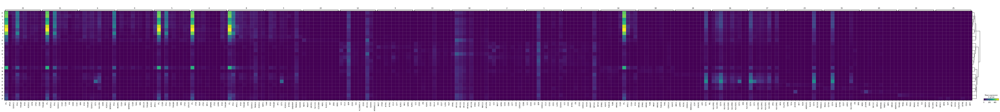

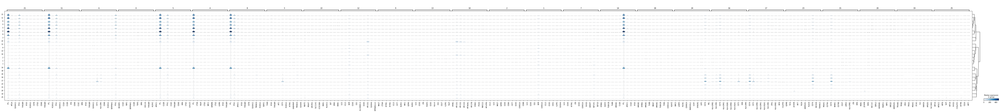

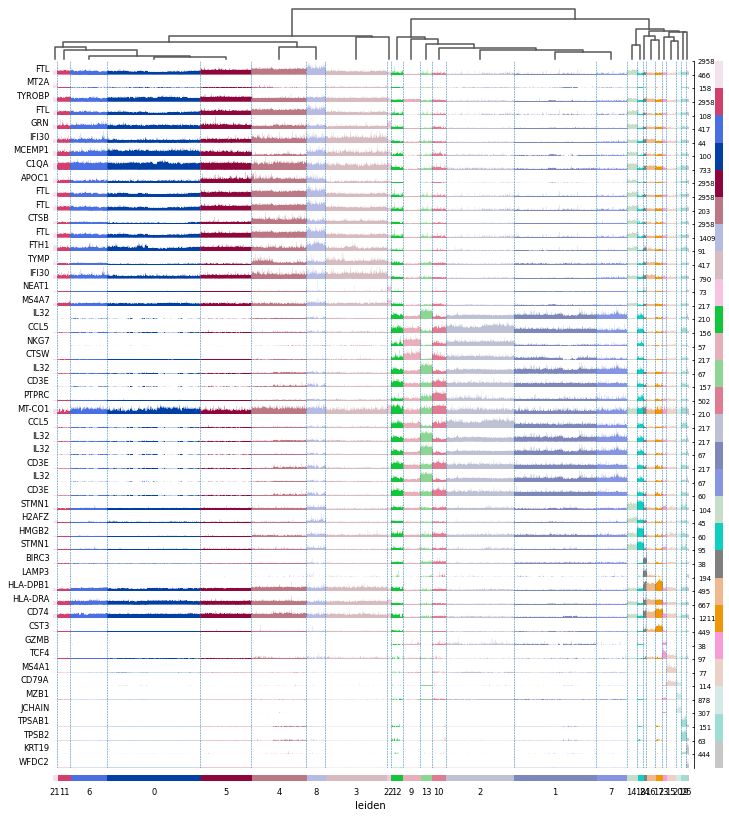

ranking genes
    finished: added to `.uns['rank_genes_samples']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:41)


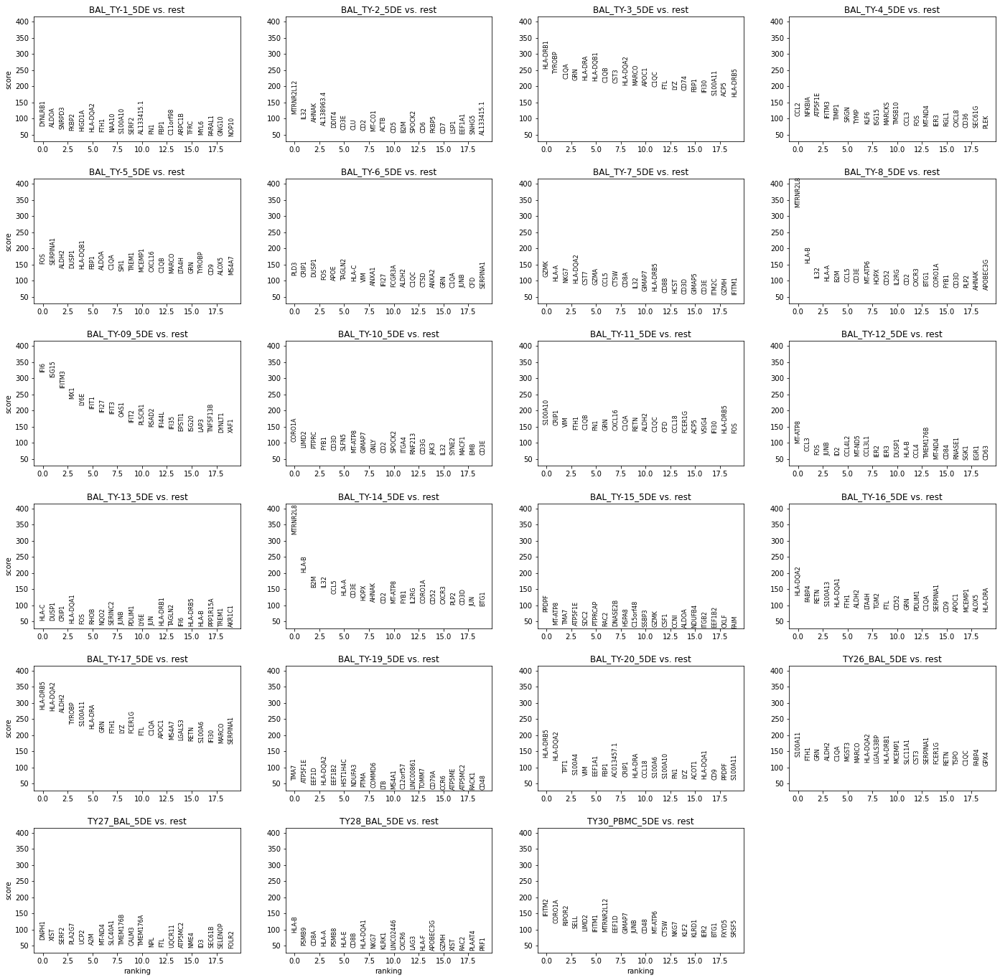

In [15]:
adata = sc_pipe.differential(adata,out_path, multi_sample = True)

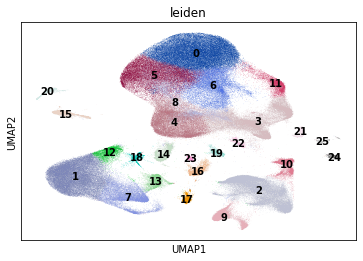

In [16]:
sc.pl.umap(adata, color='leiden',legend_loc='on data')

In [17]:
adata.write_h5ad(out_path+'/human_merged.h5ad')

In [18]:
adata=sc.read_h5ad(out_path+'/human_merged.h5ad')

running ingest
    finished (0:02:27)


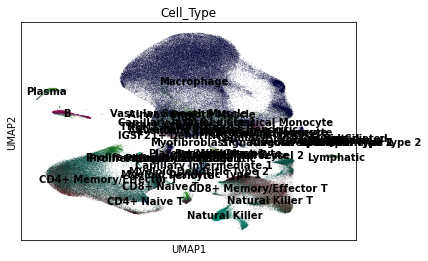

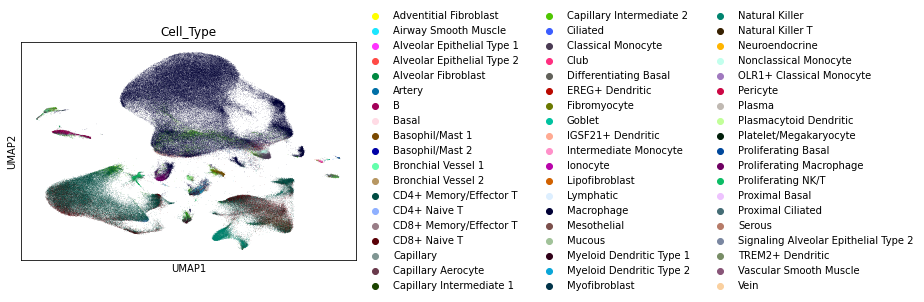

In [19]:
ad_ucsc=sc.read_h5ad('/user/ifrec/liuyuchen/Azimuth_ref/lung.h5ad')
ad_ingest = adata.copy()
var_names = ad_ucsc.var_names.intersection(ad_ingest.var_names)
ad_ucsc = ad_ucsc[:, var_names]
ad_ingest= ad_ingest[:, var_names]
sc.tl.ingest(ad_ingest, ad_ucsc, obs='Cell_Type')
adata.obs  = ad_ingest.obs
sc.pl.umap(adata, color='Cell_Type',legend_loc='on data')
sc.pl.umap(adata, color='Cell_Type')

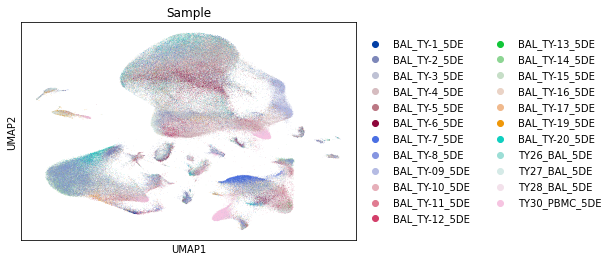

In [20]:
sc.pl.umap(adata, color='Sample')

In [21]:
adata.obs['Cell_Type'].value_counts()

Macrophage                              136619
CD4+ Memory/Effector T                   64186
CD8+ Naive T                             23240
Capillary Intermediate 2                  9195
Natural Killer                            8474
CD8+ Memory/Effector T                    5426
Classical Monocyte                        4389
Natural Killer T                          4243
Capillary                                 3777
B                                         2783
Myeloid Dendritic Type 1                  2628
Proliferating Macrophage                  1912
Proliferating NK/T                        1904
Bronchial Vessel 1                        1866
Basophil/Mast 1                           1332
Myeloid Dendritic Type 2                  1136
IGSF21+ Dendritic                          841
Plasmacytoid Dendritic                     786
Nonclassical Monocyte                      761
EREG+ Dendritic                            670
OLR1+ Classical Monocyte                   451
Club         

In [25]:
adata.obs.Sample.value_counts()

TY27_BAL     19620
BAL_TY-2     17945
BAL_TY-14    17534
BAL_TY-10    17381
BAL_TY-7     16158
BAL_TY-20    15904
BAL_TY-12    15178
BAL_TY-11    14893
BAL_TY-09    13983
TY30_PBMC    13130
BAL_TY-4     12960
BAL_TY-17    11693
BAL_TY-8     11657
BAL_TY-19    10412
BAL_TY-6     10281
BAL_TY-5      9964
BAL_TY-3      9301
BAL_TY-16     8934
BAL_TY-1      8188
TY28_BAL      8131
BAL_TY-15     7296
BAL_TY-13     4555
TY26_BAL      4047
Name: Sample, dtype: int64

In [26]:
adata.obs.Sample.unique().tolist()

['BAL_TY-09',
 'BAL_TY-10',
 'BAL_TY-11',
 'BAL_TY-12',
 'BAL_TY-13',
 'BAL_TY-14',
 'BAL_TY-15',
 'BAL_TY-1',
 'BAL_TY-16',
 'BAL_TY-17',
 'BAL_TY-19',
 'BAL_TY-20',
 'BAL_TY-2',
 'BAL_TY-3',
 'BAL_TY-4',
 'BAL_TY-5',
 'BAL_TY-6',
 'BAL_TY-7',
 'BAL_TY-8',
 'TY26_BAL',
 'TY27_BAL',
 'TY28_BAL',
 'TY30_PBMC']

In [27]:
sub=adata[adata.obs['Sample'].isin([
    'BAL_TY-09',
 'BAL_TY-11',
 'BAL_TY-12',
 'BAL_TY-13',
 'BAL_TY-14',
 'BAL_TY-15',
 'BAL_TY-1',
 'BAL_TY-16',
 'BAL_TY-17',
 'BAL_TY-19',
 'BAL_TY-20',
 'BAL_TY-2',
 'BAL_TY-3',
 'BAL_TY-4',
 'BAL_TY-5',
 'BAL_TY-6',
 'BAL_TY-7',
 'BAL_TY-8',
 'TY26_BAL',
 'TY27_BAL',
 'TY28_BAL',
])].copy()

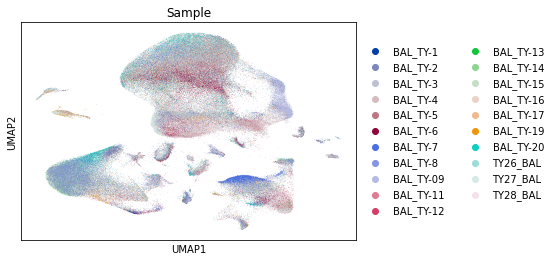

In [28]:
sc.pl.umap(sub, color='Sample')

In [29]:
sub.write_h5ad(out_path+'/human_requested_samples.h5ad')